# CSC_583
# Final Project
# Hithesh Shanmugam

## Import Necessary Packages 

In [4]:
import transformers
import pandas as pd
import torch
import torch.nn as nn
from torch.utils.data import DataLoader, Dataset
from transformers import BertTokenizer, BertForSequenceClassification
from sklearn.model_selection import train_test_split
from sklearn.metrics import f1_score, precision_score, recall_score
from collections import Counter
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.metrics import confusion_matrix
import shap

In [2]:
!pip install transformers torch tensorflow

Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 7.2/7.2 MB 82.0 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 236.8/236.8 kB 24.7 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 7.8/7.8 MB 85.8 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 1.3/1.3 MB 63.5 MB/s eta 0:00:00


In [3]:
!pip install shap

Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 572.6/572.6 kB 24.9 MB/s eta 0:00:00


In [5]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


## Overview of the Dataset 

In [37]:
# Load the CSV file
df = pd.read_csv("/content/drive/MyDrive/FakeCovid_July2020.csv")

import pandas as pd
import numpy as np

# Total number of instances
total_instances = len(df)

# Class distribution
class_distribution = df['class'].value_counts()
class_percentages = class_distribution / total_instances

# Average text length
df['text_length'] = df['content_text'].apply(lambda x: len(str(x)) if pd.notnull(x) else np.nan)
average_text_length = df['text_length'].mean()

# Print the analysis results
print("Total instances:", total_instances)
print("\nClass distribution:")
print(class_distribution)
print("\nClass percentages:")
print(class_percentages)
print("\nAverage text length:", average_text_length)
print("\nTrain-validation-test split:")
print("Train data:", len(train_dataset))
print("Validation data:", len(val_dataset))

Total instances: 7623

Class distribution:
FALSE                                 3140
False                                 3109
Misleading                             463
MISLEADING                             173
Mostly false                           101
Partly false                            99
misleading                              80
No evidence                             57
Mostly False                            43
Mixture                                 41
Explanatory                             40
True                                    34
No Evidence                             24
News                                    23
PARTLY FALSE                            22
Correct Attribution                     12
Unproven                                12
MOSTLY FALSE                            11
Miscaptioned                            10
Partly False                            10
mostly false                             9
partly false                             9
Mostly True

## Initial Steps without Extension
## Pre-Processing (3 labels)

In [ ]:
# Read the CSV file
df = pd.read_csv("/content/drive/MyDrive/FakeCovid_July2020.csv")

# Filter for English entries
df = df[df['lang'] == 'en']

# Define a function to map class labels to target categories
def map_labels(label):
    label = str(label).lower()
    if 'true' in label:
        return 'TRUE'
    elif 'false' in label:
        return 'FALSE'
    else:
        return 'UNKNOWN'

# Create a new DataFrame with the required columns
new_df = df[['content_text', 'class']]

# Drop rows with empty 'content_text' or 'class' values
new_df = new_df.dropna(subset=['content_text', 'class'])

# Map class labels to target categories
new_df['target'] = new_df['class'].apply(map_labels)

# Display the resulting DataFrame
print(new_df.head())


                                         content_text        class   target
2   The fact behind every news!, Ever since the Wo...        False    FALSE
6   AUTHOR, VERA Files, DATE, May 08, 2020, SHARE,...   MISLEADING  UNKNOWN
8   Source: Dr Anthony Nsiah Asare, Verdict: Mostl...  Mostly True     TRUE
9   More Info, Trying to focus on school work at h...        FALSE    FALSE
10  A photo of hundreds of neat piles of bedding a...        False    FALSE


## Bert Model Name: Bert-base-uncased

In [ ]:
# Set the device
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")

# Load and preprocess the dataset
texts = new_df['content_text'].tolist()
labels = new_df['target'].tolist()

# Count the occurrences of each class
class_counts = Counter(labels)

# Set the minimum number of samples per class
min_samples_per_class = 2

# Filter the classes that have enough samples
valid_classes = [cls for cls, count in class_counts.items() if count >= min_samples_per_class]

# Filter the data and labels based on the valid classes
valid_indices = [i for i, label in enumerate(labels) if label in valid_classes]
valid_texts = [texts[i] for i in valid_indices]
valid_labels = [labels[i] for i in valid_indices]

# Split the data into training and testing sets
train_texts, val_texts, train_labels, val_labels = train_test_split(
    valid_texts, valid_labels, test_size=0.2, stratify=valid_labels, random_state=42
)

# Load the BERT tokenizer
tokenizer = BertTokenizer.from_pretrained("bert-base-uncased")

# Tokenize the texts and convert them to input IDs and attention masks
train_encodings = tokenizer(train_texts, truncation=True, padding=True)
val_encodings = tokenizer(val_texts, truncation=True, padding=True)

# Create PyTorch datasets
class CustomDataset(Dataset):
    def __init__(self, encodings, labels):
        self.encodings = encodings
        self.labels = labels
    
    def __len__(self):
        return len(self.labels)
    
    def __getitem__(self, idx):
        item = {key: torch.tensor(val[idx]) for key, val in self.encodings.items()}
        label = self.labels[idx]
        label_map = {"TRUE": 1, "FALSE": 0, "UNKNOWN": 2}  # Mapping of label values
        item["target"] = torch.tensor(label_map[label], dtype=torch.long)
        return item

train_dataset = CustomDataset(train_encodings, train_labels)
val_dataset = CustomDataset(val_encodings, val_labels)

# Define the model architecture
model = BertForSequenceClassification.from_pretrained("bert-base-uncased", num_labels=3)
model.to(device)

# Define the optimizer and learning rate scheduler
optimizer = torch.optim.Adam(model.parameters(), lr=1e-5)
scheduler = torch.optim.lr_scheduler.StepLR(optimizer, step_size=5, gamma=0.1)

# Define the loss function
loss_fn = nn.CrossEntropyLoss()

# Define the training loop
def train(model, dataloader, loss_fn, optimizer, device):
    model.train()
    total_loss = 0.0
    for batch in dataloader:
        input_ids = batch["input_ids"].to(device)
        attention_mask = batch["attention_mask"].to(device)
        labels = batch["target"].to(device)
        
        optimizer.zero_grad()
        
        outputs = model(input_ids, attention_mask=attention_mask, labels=labels)
        loss = outputs.loss
        logits = outputs.logits
        
        total_loss += loss.item()
        
        loss.backward()
        optimizer.step()
    
    return total_loss / len(dataloader)

# Define the evaluation loop
def evaluate(model, dataloader, loss_fn, device):
    model.eval()
    total_loss = 0.0
    all_predictions = []
    all_labels = []
    with torch.no_grad():
        for batch in dataloader:
            input_ids = batch["input_ids"].to(device)
            attention_mask = batch["attention_mask"].to(device)
            labels = batch["target"].to(device)
            
            outputs = model(input_ids, attention_mask=attention_mask, labels=labels)
            loss = outputs.loss
            logits = outputs.logits
            
            total_loss += loss.item()
            
            predictions = logits.argmax(dim=1)
            all_predictions.extend(predictions.cpu().tolist())
            all_labels.extend(labels.cpu().tolist())
    
    return total_loss / len(dataloader), all_predictions, all_labels

# Create data loaders
train_dataloader = DataLoader(train_dataset, batch_size=16, shuffle=True)
val_dataloader = DataLoader(val_dataset, batch_size=32)

# Training and evaluation
best_val_loss = float("inf")
best_model_state = None
for epoch in range(10):  # Modify the number of epochs as needed
    train_loss = train(model, train_dataloader, loss_fn, optimizer, device)
    val_loss, val_predictions, val_labels = evaluate(model, val_dataloader, loss_fn, device)
    
    val_f1_macro = f1_score(val_labels, val_predictions, average="macro")
    val_f1_micro = f1_score(val_labels, val_predictions, average="micro")
    val_precision = precision_score(val_labels, val_predictions, average="macro")
    val_recall = recall_score(val_labels, val_predictions, average="macro")
    
    print(f"Epoch {epoch+1}:")
    print(f"  Train Loss: {train_loss:.4f}")
    print(f"  Validation Loss: {val_loss:.4f}")
    print(f"  Validation F1 (Macro): {val_f1_macro:.4f}")
    print(f"  Validation F1 (Micro): {val_f1_micro:.4f}")
    print(f"  Validation Precision: {val_precision:.4f}")
    print(f"  Validation Recall: {val_recall:.4f}")
    
    if val_loss < best_val_loss:
        best_val_loss = val_loss
        best_model_state = model.state_dict()
    
    scheduler.step()

# Save the best model
torch.save(best_model_state, "best_model.pth")

Some weights of the model checkpoint at bert-base-uncased were not used when initializing BertForSequenceClassification: ['cls.predictions.transform.LayerNorm.weight', 'cls.predictions.transform.dense.bias', 'cls.seq_relationship.weight', 'cls.predictions.transform.LayerNorm.bias', 'cls.predictions.bias', 'cls.predictions.decoder.weight', 'cls.predictions.transform.dense.weight', 'cls.seq_relationship.bias']
- This IS expected if you are initializing BertForSequenceClassification from the checkpoint of a model trained on another task or with another architecture (e.g. initializing a BertForSequenceClassification model from a BertForPreTraining model).
- This IS NOT expected if you are initializing BertForSequenceClassification from the checkpoint of a model that you expect to be exactly identical (initializing a BertForSequenceClassification model from a BertForSequenceClassification model).
Some weights of BertForSequenceClassification were not initialized from the model checkpoint at

Epoch 1:
  Train Loss: 0.4926
  Validation Loss: 0.3995
  Validation F1 (Macro): 0.4436
  Validation F1 (Micro): 0.8576
  Validation Precision: 0.4572
  Validation Recall: 0.4366


/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


Epoch 2:
  Train Loss: 0.4214
  Validation Loss: 0.3740
  Validation F1 (Macro): 0.3149
  Validation F1 (Micro): 0.8489
  Validation Precision: 0.6162
  Validation Recall: 0.3378


/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


Epoch 3:
  Train Loss: 0.3770
  Validation Loss: 0.4204
  Validation F1 (Macro): 0.4590
  Validation F1 (Micro): 0.8383
  Validation Precision: 0.4462
  Validation Recall: 0.4748


/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


Epoch 4:
  Train Loss: 0.3197
  Validation Loss: 0.3497
  Validation F1 (Macro): 0.4790
  Validation F1 (Micro): 0.8629
  Validation Precision: 0.4776
  Validation Recall: 0.4806
Epoch 5:
  Train Loss: 0.2470
  Validation Loss: 0.3562
  Validation F1 (Macro): 0.5780
  Validation F1 (Micro): 0.8594
  Validation Precision: 0.6145
  Validation Recall: 0.5617
Epoch 6:
  Train Loss: 0.1455
  Validation Loss: 0.3490
  Validation F1 (Macro): 0.5636
  Validation F1 (Micro): 0.8787
  Validation Precision: 0.6337
  Validation Recall: 0.5329
Epoch 7:
  Train Loss: 0.1315
  Validation Loss: 0.3625
  Validation F1 (Macro): 0.5840
  Validation F1 (Micro): 0.8875
  Validation Precision: 0.7341
  Validation Recall: 0.5440
Epoch 8:
  Train Loss: 0.1187
  Validation Loss: 0.3616
  Validation F1 (Macro): 0.5814
  Validation F1 (Micro): 0.8805
  Validation Precision: 0.7212
  Validation Recall: 0.5489
Epoch 9:
  Train Loss: 0.1123
  Validation Loss: 0.3771
  Validation F1 (Macro): 0.5692
  Validation F1 (

## XAI: SHAPLEY

In [ ]:
# build a pipeline object to do predictions
pred = transformers.pipeline("text-classification", model=model, tokenizer=tokenizer, device=0, return_all_scores=True)
explainer = shap.Explainer(pred)
shap_values = explainer(new_df['target'][:3])
shap.plots.text(shap_values)

## Extension 1: New Model
## Model Name: yiyanghkust/finbert-tone

In [ ]:
# Set the device
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")

# Load and preprocess the dataset
texts = new_df['content_text'].tolist()
labels = new_df['target'].tolist()

# Count the occurrences of each class
class_counts = Counter(labels)

# Set the minimum number of samples per class
min_samples_per_class = 2

# Filter the classes that have enough samples
valid_classes = [cls for cls, count in class_counts.items() if count >= min_samples_per_class]

# Filter the data and labels based on the valid classes
valid_indices = [i for i, label in enumerate(labels) if label in valid_classes]
valid_texts = [texts[i] for i in valid_indices]
valid_labels = [labels[i] for i in valid_indices]

# Split the data into training and testing sets
train_texts, val_texts, train_labels, val_labels = train_test_split(
    valid_texts, valid_labels, test_size=0.2, stratify=valid_labels, random_state=42
)

# Load the BERT tokenizer
tokenizer = BertTokenizer.from_pretrained("bert-base-uncased")

# Tokenize the texts and convert them to input IDs and attention masks
train_encodings = tokenizer(train_texts, truncation=True, padding=True)
val_encodings = tokenizer(val_texts, truncation=True, padding=True)

# Create PyTorch datasets
class CustomDataset(Dataset):
    def __init__(self, encodings, labels):
        self.encodings = encodings
        self.labels = labels
    
    def __len__(self):
        return len(self.labels)
    
    def __getitem__(self, idx):
        item = {key: torch.tensor(val[idx]) for key, val in self.encodings.items()}
        label = self.labels[idx]
        label_map = {"TRUE": 1, "FALSE": 0, "UNKNOWN": 2}  # Mapping of label values
        item["target"] = torch.tensor(label_map[label], dtype=torch.long)
        return item

train_dataset = CustomDataset(train_encodings, train_labels)
val_dataset = CustomDataset(val_encodings, val_labels)

# Define the model architecture
model = BertForSequenceClassification.from_pretrained("yiyanghkust/finbert-tone", num_labels=3)
model.to(device)

# Define the optimizer and learning rate scheduler
optimizer = torch.optim.Adam(model.parameters(), lr=1e-5)
scheduler = torch.optim.lr_scheduler.StepLR(optimizer, step_size=5, gamma=0.1)

# Define the loss function
loss_fn = nn.CrossEntropyLoss()

# Define the training loop
def train(model, dataloader, loss_fn, optimizer, device):
    model.train()
    total_loss = 0.0
    for batch in dataloader:
        input_ids = batch["input_ids"].to(device)
        attention_mask = batch["attention_mask"].to(device)
        labels = batch["target"].to(device)
        
        optimizer.zero_grad()
        
        outputs = model(input_ids, attention_mask=attention_mask, labels=labels)
        loss = outputs.loss
        logits = outputs.logits
        
        total_loss += loss.item()
        
        loss.backward()
        optimizer.step()
    
    return total_loss / len(dataloader)

# Define the evaluation loop
def evaluate(model, dataloader, loss_fn, device):
    model.eval()
    total_loss = 0.0
    all_predictions = []
    all_labels = []
    with torch.no_grad():
        for batch in dataloader:
            input_ids = batch["input_ids"].to(device)
            attention_mask = batch["attention_mask"].to(device)
            labels = batch["target"].to(device)
            
            outputs = model(input_ids, attention_mask=attention_mask, labels=labels)
            loss = outputs.loss
            logits = outputs.logits
            
            total_loss += loss.item()
            
            predictions = logits.argmax(dim=1)
            all_predictions.extend(predictions.cpu().tolist())
            all_labels.extend(labels.cpu().tolist())
    
    return total_loss / len(dataloader), all_predictions, all_labels

# Create data loaders
train_dataloader = DataLoader(train_dataset, batch_size=16, shuffle=True)
val_dataloader = DataLoader(val_dataset, batch_size=32)

# Training and evaluation
best_val_loss = float("inf")
best_model_state = None
for epoch in range(10):  # Modify the number of epochs as needed
    train_loss = train(model, train_dataloader, loss_fn, optimizer, device)
    val_loss, val_predictions, val_labels = evaluate(model, val_dataloader, loss_fn, device)
    
    val_f1_macro = f1_score(val_labels, val_predictions, average="macro")
    val_f1_micro = f1_score(val_labels, val_predictions, average="micro")
    val_precision = precision_score(val_labels, val_predictions, average="macro")
    val_recall = recall_score(val_labels, val_predictions, average="macro")
    
    print(f"Epoch {epoch+1}:")
    print(f"  Train Loss: {train_loss:.4f}")
    print(f"  Validation Loss: {val_loss:.4f}")
    print(f"  Validation F1 (Macro): {val_f1_macro:.4f}")
    print(f"  Validation F1 (Micro): {val_f1_micro:.4f}")
    print(f"  Validation Precision: {val_precision:.4f}")
    print(f"  Validation Recall: {val_recall:.4f}")
    
    if val_loss < best_val_loss:
        best_val_loss = val_loss
        best_model_state = model.state_dict()
    
    scheduler.step()

# Save the best model
torch.save(best_model_state, "best_model.pth")

/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


Epoch 1:
  Train Loss: 0.5186
  Validation Loss: 0.4196
  Validation F1 (Macro): 0.3738
  Validation F1 (Micro): 0.8489
  Validation Precision: 0.3805
  Validation Recall: 0.3839


/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


Epoch 2:
  Train Loss: 0.4602
  Validation Loss: 0.4324
  Validation F1 (Macro): 0.4306
  Validation F1 (Micro): 0.8612
  Validation Precision: 0.4633
  Validation Recall: 0.4189


/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


Epoch 3:
  Train Loss: 0.4144
  Validation Loss: 0.4018
  Validation F1 (Macro): 0.3694
  Validation F1 (Micro): 0.8559
  Validation Precision: 0.5089
  Validation Recall: 0.3673
Epoch 4:
  Train Loss: 0.3810
  Validation Loss: 0.4171
  Validation F1 (Macro): 0.4084
  Validation F1 (Micro): 0.8576
  Validation Precision: 0.7127
  Validation Recall: 0.3891
Epoch 5:
  Train Loss: 0.3279
  Validation Loss: 0.3859
  Validation F1 (Macro): 0.5498
  Validation F1 (Micro): 0.8453
  Validation Precision: 0.6159
  Validation Recall: 0.5181
Epoch 6:
  Train Loss: 0.2090
  Validation Loss: 0.3956
  Validation F1 (Macro): 0.6142
  Validation F1 (Micro): 0.8489
  Validation Precision: 0.6630
  Validation Recall: 0.5846
Epoch 7:
  Train Loss: 0.1847
  Validation Loss: 0.4096
  Validation F1 (Macro): 0.6070
  Validation F1 (Micro): 0.8489
  Validation Precision: 0.6052
  Validation Recall: 0.6095
Epoch 8:
  Train Loss: 0.1522
  Validation Loss: 0.4095
  Validation F1 (Macro): 0.6027
  Validation F1 (

## XAI: SHAPLEY 

In [ ]:
# build a pipeline object to do predictions
pred = transformers.pipeline("text-classification", model=model, tokenizer=tokenizer, device=0, return_all_scores=True)
explainer = shap.Explainer(pred)
shap_values = explainer(new_df['target'][:3])
shap.plots.text(shap_values)

## Extension 2: Adding Extra Labels
## Pre-Processing (5 labels)

In [ ]:
# Read the CSV file
df = pd.read_csv("/content/drive/MyDrive/FakeCovid_July2020.csv")

# Filter for English entries
df = df[df['lang'] == 'en']

# Define a function to map class labels to target categories
def map_labels(label):
    label = str(label).lower()
    if 'true' in label:
        return 'TRUE'
    elif 'false' in label:
        return 'FALSE'
    elif 'misleading' in label:
        return 'MISLEADING'
    elif 'unverified' in label:
        return 'UNVERIFIED'
    else:
        return 'UNKNOWN'

# Create a new DataFrame with the required columns
new_df = df[['content_text', 'class']]

# Drop rows with empty 'content_text' or 'class' values
new_df = new_df.dropna(subset=['content_text', 'class'])

# Map class labels to target categories
new_df['target'] = new_df['class'].apply(map_labels)

# Display the resulting DataFrame
print(new_df.head())

                                         content_text        class      target
2   The fact behind every news!, Ever since the Wo...        False       FALSE
6   AUTHOR, VERA Files, DATE, May 08, 2020, SHARE,...   MISLEADING  MISLEADING
8   Source: Dr Anthony Nsiah Asare, Verdict: Mostl...  Mostly True        TRUE
9   More Info, Trying to focus on school work at h...        FALSE       FALSE
10  A photo of hundreds of neat piles of bedding a...        False       FALSE


## Model Name: bert-base-uncased

Some weights of the model checkpoint at bert-base-uncased were not used when initializing BertForSequenceClassification: ['cls.predictions.bias', 'cls.predictions.transform.LayerNorm.bias', 'cls.seq_relationship.weight', 'cls.predictions.transform.dense.weight', 'cls.seq_relationship.bias', 'cls.predictions.transform.dense.bias', 'cls.predictions.transform.LayerNorm.weight']
- This IS expected if you are initializing BertForSequenceClassification from the checkpoint of a model trained on another task or with another architecture (e.g. initializing a BertForSequenceClassification model from a BertForPreTraining model).
- This IS NOT expected if you are initializing BertForSequenceClassification from the checkpoint of a model that you expect to be exactly identical (initializing a BertForSequenceClassification model from a BertForSequenceClassification model).
Some weights of BertForSequenceClassification were not initialized from the model checkpoint at bert-base-uncased and are newly i

Epoch 1:
  Train Loss: 0.6523
  Validation Loss: 0.5036
  Validation F1 (Macro): 0.2293
  Validation F1 (Micro): 0.8471
  Validation Precision: 0.2118
  Validation Recall: 0.2500


/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


Epoch 2:
  Train Loss: 0.4812
  Validation Loss: 0.4653
  Validation F1 (Macro): 0.3136
  Validation F1 (Micro): 0.8524
  Validation Precision: 0.3502
  Validation Recall: 0.3084


/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


Epoch 3:
  Train Loss: 0.4384
  Validation Loss: 0.4250
  Validation F1 (Macro): 0.3442
  Validation F1 (Micro): 0.8524
  Validation Precision: 0.3371
  Validation Recall: 0.3535


/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


Epoch 4:
  Train Loss: 0.3820
  Validation Loss: 0.4070
  Validation F1 (Macro): 0.3329
  Validation F1 (Micro): 0.8515
  Validation Precision: 0.5862
  Validation Recall: 0.3333


/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


Epoch 5:
  Train Loss: 0.3039
  Validation Loss: 0.3871
  Validation F1 (Macro): 0.3540
  Validation F1 (Micro): 0.8534
  Validation Precision: 0.4866
  Validation Recall: 0.3497


/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


Epoch 6:
  Train Loss: 0.2301
  Validation Loss: 0.4625
  Validation F1 (Macro): 0.3673
  Validation F1 (Micro): 0.8553
  Validation Precision: 0.4841
  Validation Recall: 0.3599


/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


Epoch 7:
  Train Loss: 0.1671
  Validation Loss: 0.4096
  Validation F1 (Macro): 0.3907
  Validation F1 (Micro): 0.8576
  Validation Precision: 0.4900
  Validation Recall: 0.3818


/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


Epoch 8:
  Train Loss: 0.1377
  Validation Loss: 0.4276
  Validation F1 (Macro): 0.4066
  Validation F1 (Micro): 0.8594
  Validation Precision: 0.4893
  Validation Recall: 0.3970


/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


Epoch 9:
  Train Loss: 0.0919
  Validation Loss: 0.4647
  Validation F1 (Macro): 0.4164
  Validation F1 (Micro): 0.8604
  Validation Precision: 0.4898
  Validation Recall: 0.4078
Epoch 10:
  Train Loss: 0.0703
  Validation Loss: 0.4895
  Validation F1 (Macro): 0.4415
  Validation F1 (Micro): 0.8624
  Validation Precision: 0.6109
  Validation Recall: 0.4222


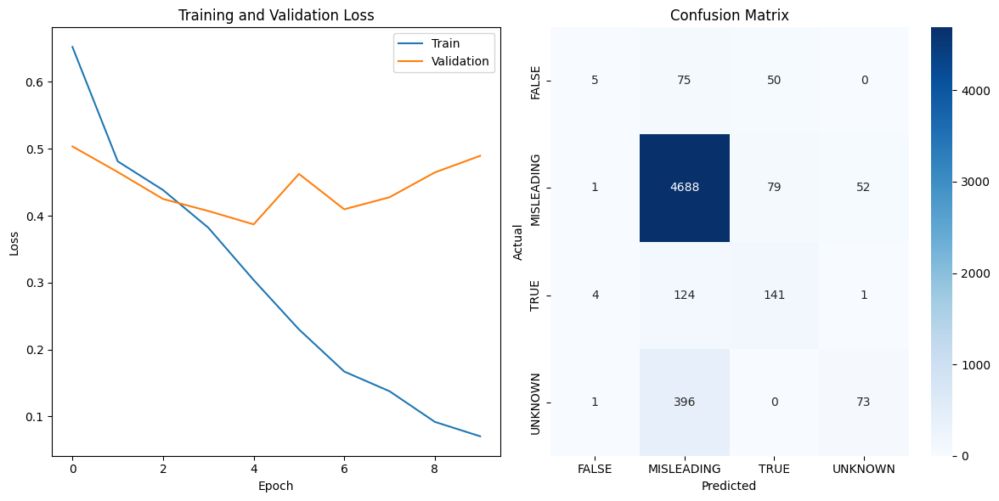

In [ ]:
# Set the device
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")

# Load and preprocess the dataset
texts = new_df['content_text'].tolist()
labels = new_df['target'].tolist()

# Count the occurrences of each class
class_counts = Counter(labels)

# Set the minimum number of samples per class
min_samples_per_class = 2

# Filter the classes that have enough samples
valid_classes = [cls for cls, count in class_counts.items() if count >= min_samples_per_class]

# Filter the data and labels based on the valid classes
valid_indices = [i for i, label in enumerate(labels) if label in valid_classes]
valid_texts = [texts[i] for i in valid_indices]
valid_labels = [labels[i] for i in valid_indices]

# Split the data into training and testing sets
train_texts, val_texts, train_labels, val_labels = train_test_split(
    valid_texts, valid_labels, test_size=0.2, stratify=valid_labels, random_state=42
)

# Load the BERT tokenizer
tokenizer = BertTokenizer.from_pretrained("bert-base-uncased")

# Tokenize the texts and convert them to input IDs and attention masks
train_encodings = tokenizer(train_texts, truncation=True, padding=True)
val_encodings = tokenizer(val_texts, truncation=True, padding=True)

# Create PyTorch datasets
class CustomDataset(Dataset):
    def __init__(self, encodings, labels):
        self.encodings = encodings
        self.labels = labels
    
    def __len__(self):
        return len(self.labels)
    
    def __getitem__(self, idx):
        item = {key: torch.tensor(val[idx]) for key, val in self.encodings.items()}
        label = self.labels[idx]
        label_map = {"TRUE": 0, "FALSE": 1, "UNKNOWN": 2, "MISLEADING": 3, "UNVERIFIED": 4}  # Mapping of label values
        item["target"] = torch.tensor(label_map[label], dtype=torch.long)
        return item

train_dataset = CustomDataset(train_encodings, train_labels)
val_dataset = CustomDataset(val_encodings, val_labels)

# Define the model architecture
model = BertForSequenceClassification.from_pretrained("bert-base-uncased", num_labels=5)
model.to(device)

# Define the optimizer and learning rate scheduler
optimizer = torch.optim.Adam(model.parameters(), lr=1e-5)
scheduler = torch.optim.lr_scheduler.StepLR(optimizer, step_size=5, gamma=0.1)

# Define the loss function
loss_fn = nn.CrossEntropyLoss()

# Define the training loop
def train(model, dataloader, loss_fn, optimizer, device):
    model.train()
    total_loss = 0.0
    for batch in dataloader:
        input_ids = batch["input_ids"].to(device)
        attention_mask = batch["attention_mask"].to(device)
        labels = batch["target"].to(device)
        
        optimizer.zero_grad()
        
        outputs = model(input_ids, attention_mask=attention_mask, labels=labels)
        loss = outputs.loss
        logits = outputs.logits
        
        total_loss += loss.item()
        
        loss.backward()
        optimizer.step()
    
    return total_loss / len(dataloader)

# Define the evaluation loop
def evaluate(model, dataloader, loss_fn, device):
    model.eval()
    total_loss = 0.0
    all_predictions = []
    all_labels = []
    with torch.no_grad():
        for batch in dataloader:
            input_ids = batch["input_ids"].to(device)
            attention_mask = batch["attention_mask"].to(device)
            labels = batch["target"].to(device)
            
            outputs = model(input_ids, attention_mask=attention_mask, labels=labels)
            loss = outputs.loss
            logits = outputs.logits
            
            total_loss += loss.item()
            
            predictions = logits.argmax(dim=1)
            all_predictions.extend(predictions.cpu().tolist())
            all_labels.extend(labels.cpu().tolist())
    
    return total_loss / len(dataloader), all_predictions, all_labels

# Create data loaders
train_dataloader = DataLoader(train_dataset, batch_size=16, shuffle=True)
val_dataloader = DataLoader(val_dataset, batch_size=32)

# Training and evaluation
best_val_loss = float("inf")
best_model_state = None
train_losses = []
val_losses = []
val_predictions = []
val_labels = []

for epoch in range(10):  # Modify the number of epochs as needed
    train_loss = train(model, train_dataloader, loss_fn, optimizer, device)
    val_loss, predictions, labels = evaluate(model, val_dataloader, loss_fn, device)
    
    train_losses.append(train_loss)
    val_losses.append(val_loss)
    val_predictions.extend(predictions)
    val_labels.extend(labels)
    
    val_f1_macro = f1_score(val_labels, val_predictions, average="macro")
    val_f1_micro = f1_score(val_labels, val_predictions, average="micro")
    val_precision = precision_score(val_labels, val_predictions, average="macro")
    val_recall = recall_score(val_labels, val_predictions, average="macro")
    
    print(f"Epoch {epoch+1}:")
    print(f"  Train Loss: {train_loss:.4f}")
    print(f"  Validation Loss: {val_loss:.4f}")
    print(f"  Validation F1 (Macro): {val_f1_macro:.4f}")
    print(f"  Validation F1 (Micro): {val_f1_micro:.4f}")
    print(f"  Validation Precision: {val_precision:.4f}")
    print(f"  Validation Recall: {val_recall:.4f}")
    
    if val_loss < best_val_loss:
        best_val_loss = val_loss
        best_model_state = model.state_dict()

# Load the best model state
model.load_state_dict(best_model_state)

# Visualization
plt.figure(figsize=(12, 6))

# Loss curve
plt.subplot(1, 2, 1)
plt.plot(train_losses, label="Train")
plt.plot(val_losses, label="Validation")
plt.xlabel("Epoch")
plt.ylabel("Loss")
plt.title("Training and Validation Loss")
plt.legend()

# Confusion matrix
plt.subplot(1, 2, 2)
cm = confusion_matrix(val_labels, val_predictions)
sns.heatmap(cm, annot=True, fmt="d", cmap="Blues", xticklabels=valid_classes, yticklabels=valid_classes)
plt.xlabel("Predicted")
plt.ylabel("Actual")
plt.title("Confusion Matrix")

plt.tight_layout()
plt.show()

# Extension 3: Adding Extra Features
## Pre-Processing (5 labels)

In [6]:
# Read the CSV file
df = pd.read_csv("/content/drive/MyDrive/FakeCovid_July2020.csv")

# Filter for English entries
df = df[df['lang'] == 'en']

# Define a function to map class labels to target categories
def map_labels(label):
    label = str(label).lower()
    if 'true' in label:
        return 'TRUE'
    elif 'false' in label:
        return 'FALSE'
    elif 'misleading' in label:
        return 'MISLEADING'
    elif 'unverified' in label:
        return 'UNVERIFIED'
    else:
        return 'UNKNOWN'

# Create a new DataFrame with the required columns
new_df = df[['content_text', 'title', 'source_title', 'ref_category_title', 'class']]

# Drop rows with empty 'content_text' or 'class' values
new_df = new_df.dropna(subset=['content_text', 'class'])

# Map class labels to target categories
new_df['target'] = new_df['class'].apply(map_labels)

# Display the resulting DataFrame
print(new_df.head())

                                         content_text  \
2   The fact behind every news!, Ever since the Wo...   
6   AUTHOR, VERA Files, DATE, May 08, 2020, SHARE,...   
8   Source: Dr Anthony Nsiah Asare, Verdict: Mostl...   
9   More Info, Trying to focus on school work at h...   
10  A photo of hundreds of neat piles of bedding a...   

                                                title  \
2    Chinese converting to Islam after realizing t...   
6    Captions on a reuploaded video about the U.S....   
8    Ghana has 307 ambulances with mobile ventilat...   
9    “Governor Andy Beshear has authorized Kentuck...   
10   Photo shows food being distributed to Rwandan...   

                                         source_title  \
2   Are Chinese people converting to Islam in fear...   
6   VERA FILES FACT CHECK: Remdesivir to ‘end’ COV...   
8   Fact-check: Does Ghana have 307 ambulances wit...   
9   PolitiFact | No, Kentucky teachers won’t be co...   
10  Food distribution during 

## Model Name: bert-base-uncased

Some weights of the model checkpoint at bert-base-uncased were not used when initializing BertForSequenceClassification: ['cls.seq_relationship.bias', 'cls.predictions.transform.LayerNorm.bias', 'cls.predictions.transform.LayerNorm.weight', 'cls.predictions.bias', 'cls.predictions.transform.dense.bias', 'cls.seq_relationship.weight', 'cls.predictions.transform.dense.weight']
- This IS expected if you are initializing BertForSequenceClassification from the checkpoint of a model trained on another task or with another architecture (e.g. initializing a BertForSequenceClassification model from a BertForPreTraining model).
- This IS NOT expected if you are initializing BertForSequenceClassification from the checkpoint of a model that you expect to be exactly identical (initializing a BertForSequenceClassification model from a BertForSequenceClassification model).
Some weights of BertForSequenceClassification were not initialized from the model checkpoint at bert-base-uncased and are newly i

Epoch 1:
  Train Loss: 0.6045
  Validation Loss: 0.4977
  Validation F1 (Macro): 0.3736
  Validation F1 (Micro): 0.8506
  Validation Precision: 0.3325
  Validation Recall: 0.4433


Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.


Epoch 2:
  Train Loss: 0.4625
  Validation Loss: 0.4345
  Validation F1 (Macro): 0.3840
  Validation F1 (Micro): 0.8515
  Validation Precision: 0.4996
  Validation Recall: 0.4484


Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.


Epoch 3:
  Train Loss: 0.4143
  Validation Loss: 0.4182
  Validation F1 (Macro): 0.3730
  Validation F1 (Micro): 0.8518
  Validation Precision: 0.4592
  Validation Recall: 0.3976


Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.


Epoch 4:
  Train Loss: 0.3337
  Validation Loss: 0.4165
  Validation F1 (Macro): 0.3926
  Validation F1 (Micro): 0.8511
  Validation Precision: 0.4393
  Validation Recall: 0.4100


Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.


Epoch 5:
  Train Loss: 0.2659
  Validation Loss: 0.4674
  Validation F1 (Macro): 0.3879
  Validation F1 (Micro): 0.8510
  Validation Precision: 0.4416
  Validation Recall: 0.3968
Epoch 6:
  Train Loss: 0.2035
  Validation Loss: 0.4173
  Validation F1 (Macro): 0.4076
  Validation F1 (Micro): 0.8512
  Validation Precision: 0.4511
  Validation Recall: 0.4160
Epoch 7:
  Train Loss: 0.1463
  Validation Loss: 0.4023
  Validation F1 (Macro): 0.4232
  Validation F1 (Micro): 0.8539
  Validation Precision: 0.4624
  Validation Recall: 0.4251
Epoch 8:
  Train Loss: 0.0995
  Validation Loss: 0.4915
  Validation F1 (Macro): 0.4399
  Validation F1 (Micro): 0.8565
  Validation Precision: 0.5525
  Validation Recall: 0.4336
Epoch 9:
  Train Loss: 0.0856
  Validation Loss: 0.4516
  Validation F1 (Macro): 0.4692
  Validation F1 (Micro): 0.8555
  Validation Precision: 0.5595
  Validation Recall: 0.4507
Epoch 10:
  Train Loss: 0.0584
  Validation Loss: 0.4928
  Validation F1 (Macro): 0.4732
  Validation F1 

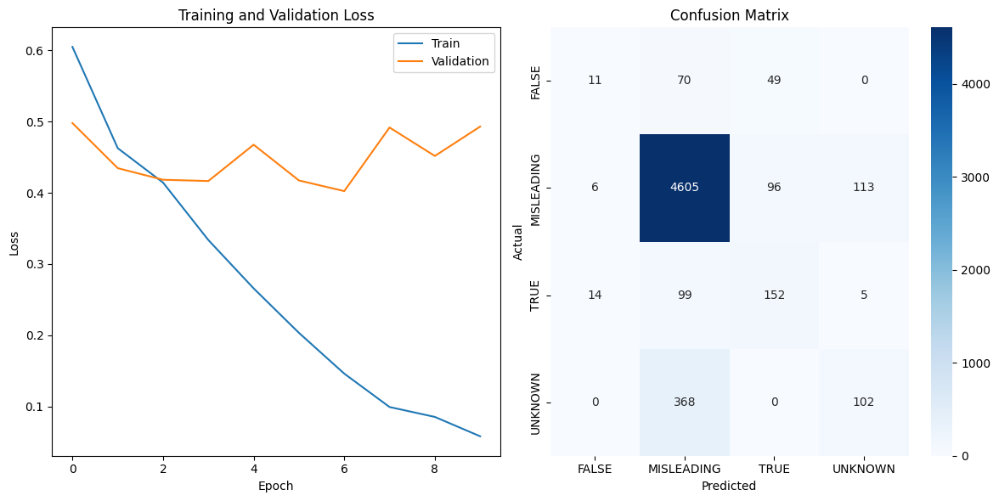

In [7]:
# Set the device
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")

# Load and preprocess the dataset
texts = new_df['content_text'].tolist()
labels = new_df['target'].tolist()

# Count the occurrences of each class
class_counts = Counter(labels)

# Set the minimum number of samples per class
min_samples_per_class = 2

# Filter the classes that have enough samples
valid_classes = [cls for cls, count in class_counts.items() if count >= min_samples_per_class]

# Filter the data and labels based on the valid classes
valid_indices = [i for i, label in enumerate(labels) if label in valid_classes]
valid_texts = [texts[i] for i in valid_indices]
valid_labels = [labels[i] for i in valid_indices]

# Split the data into training and testing sets
train_texts, val_texts, train_labels, val_labels = train_test_split(
    valid_texts, valid_labels, test_size=0.2, stratify=valid_labels, random_state=42
)

# Load the BERT tokenizer
tokenizer = BertTokenizer.from_pretrained("bert-base-uncased")

# Tokenize the texts and convert them to input IDs and attention masks
train_encodings = tokenizer(train_texts, truncation=True, padding=True)
val_encodings = tokenizer(val_texts, truncation=True, padding=True)

# Create PyTorch datasets
class CustomDataset(Dataset):
    def __init__(self, encodings, labels):
        self.encodings = encodings
        self.labels = labels
    
    def __len__(self):
        return len(self.labels)
    
    def __getitem__(self, idx):
        item = {key: torch.tensor(val[idx]) for key, val in self.encodings.items()}
        label = self.labels[idx]
        label_map = {"TRUE": 0, "FALSE": 1, "UNKNOWN": 2, "MISLEADING": 3, "UNVERIFIED": 4}  # Mapping of label values
        item["target"] = torch.tensor(label_map[label], dtype=torch.long)
        return item

train_dataset = CustomDataset(train_encodings, train_labels)
val_dataset = CustomDataset(val_encodings, val_labels)

# Define the model architecture
model = BertForSequenceClassification.from_pretrained("bert-base-uncased", num_labels=5)
model.to(device)

# Define the optimizer and learning rate scheduler
optimizer = torch.optim.Adam(model.parameters(), lr=1e-5)
scheduler = torch.optim.lr_scheduler.StepLR(optimizer, step_size=5, gamma=0.1)

# Define the loss function
loss_fn = nn.CrossEntropyLoss()

# Define the training loop
def train(model, dataloader, loss_fn, optimizer, device):
    model.train()
    total_loss = 0.0
    for batch in dataloader:
        input_ids = batch["input_ids"].to(device)
        attention_mask = batch["attention_mask"].to(device)
        labels = batch["target"].to(device)
        
        optimizer.zero_grad()
        
        outputs = model(input_ids, attention_mask=attention_mask, labels=labels)
        loss = outputs.loss
        logits = outputs.logits
        
        total_loss += loss.item()
        
        loss.backward()
        optimizer.step()
    
    return total_loss / len(dataloader)

# Define the evaluation loop
def evaluate(model, dataloader, loss_fn, device):
    model.eval()
    total_loss = 0.0
    all_predictions = []
    all_labels = []
    with torch.no_grad():
        for batch in dataloader:
            input_ids = batch["input_ids"].to(device)
            attention_mask = batch["attention_mask"].to(device)
            labels = batch["target"].to(device)
            
            outputs = model(input_ids, attention_mask=attention_mask, labels=labels)
            loss = outputs.loss
            logits = outputs.logits
            
            total_loss += loss.item()
            
            predictions = logits.argmax(dim=1)
            all_predictions.extend(predictions.cpu().tolist())
            all_labels.extend(labels.cpu().tolist())
    
    return total_loss / len(dataloader), all_predictions, all_labels

# Create data loaders
train_dataloader = DataLoader(train_dataset, batch_size=16, shuffle=True)
val_dataloader = DataLoader(val_dataset, batch_size=32)

# Training and evaluation
best_val_loss = float("inf")
best_model_state = None
train_losses = []
val_losses = []
val_predictions = []
val_labels = []

for epoch in range(10):  # Modify the number of epochs as needed
    train_loss = train(model, train_dataloader, loss_fn, optimizer, device)
    val_loss, predictions, labels = evaluate(model, val_dataloader, loss_fn, device)
    
    train_losses.append(train_loss)
    val_losses.append(val_loss)
    val_predictions.extend(predictions)
    val_labels.extend(labels)
    
    val_f1_macro = f1_score(val_labels, val_predictions, average="macro")
    val_f1_micro = f1_score(val_labels, val_predictions, average="micro")
    val_precision = precision_score(val_labels, val_predictions, average="macro")
    val_recall = recall_score(val_labels, val_predictions, average="macro")
    
    print(f"Epoch {epoch+1}:")
    print(f"  Train Loss: {train_loss:.4f}")
    print(f"  Validation Loss: {val_loss:.4f}")
    print(f"  Validation F1 (Macro): {val_f1_macro:.4f}")
    print(f"  Validation F1 (Micro): {val_f1_micro:.4f}")
    print(f"  Validation Precision: {val_precision:.4f}")
    print(f"  Validation Recall: {val_recall:.4f}")
    
    if val_loss < best_val_loss:
        best_val_loss = val_loss
        best_model_state = model.state_dict()

# Load the best model state
model.load_state_dict(best_model_state)

# Visualization
plt.figure(figsize=(12, 6))

# Loss curve
plt.subplot(1, 2, 1)
plt.plot(train_losses, label="Train")
plt.plot(val_losses, label="Validation")
plt.xlabel("Epoch")
plt.ylabel("Loss")
plt.title("Training and Validation Loss")
plt.legend()

# Confusion matrix
plt.subplot(1, 2, 2)
cm = confusion_matrix(val_labels, val_predictions)
sns.heatmap(cm, annot=True, fmt="d", cmap="Blues", xticklabels=valid_classes, yticklabels=valid_classes)
plt.xlabel("Predicted")
plt.ylabel("Actual")
plt.title("Confusion Matrix")

plt.tight_layout()
plt.show()

## XAI: SHAPLEY

In [ ]:
# build a pipeline object to do predictions
pred = transformers.pipeline("text-classification", model=model, tokenizer=tokenizer, device=0, return_all_scores=True)
explainer = shap.Explainer(pred)
# For the target feature
shap_values = explainer(new_df['target'][:3])
shap.plots.text(shap_values)

In [8]:
# For the class feature
shap_values = explainer(new_df['class'][:3])
shap.plots.text(shap_values)

`return_all_scores` is now deprecated,  if want a similar funcionality use `top_k=None` instead of `return_all_scores=True` or `top_k=1` instead of `return_all_scores=False`.
Xformers is not installed correctly. If you want to use memory_efficient_attention to accelerate training use the following command to install Xformers
pip install xformers.
You seem to be using the pipelines sequentially on GPU. In order to maximize efficiency please use a dataset


In [10]:
# For the title feature
shap_values = explainer(new_df['title'][:3])
shap.plots.text(shap_values)

  0%|          | 0/420 [00:00<?, ?it/s]

Partition explainer:  33%|███▎      | 1/3 [00:00<?, ?it/s]

  0%|          | 0/498 [00:00<?, ?it/s]

Partition explainer: 4it [00:21,  7.19s/it]


In [11]:
# For the source_title feature
shap_values = explainer(new_df['source_title'][:3])
shap.plots.text(shap_values)

  0%|          | 0/498 [00:00<?, ?it/s]

Partition explainer:  33%|███▎      | 1/3 [00:00<?, ?it/s]

  0%|          | 0/498 [00:00<?, ?it/s]

Partition explainer: 100%|██████████| 3/3 [00:19<00:00,  4.22s/it]

  0%|          | 0/420 [00:00<?, ?it/s]

Partition explainer: 4it [00:27,  9.05s/it]


In [12]:
# For the ref_category_title feature
shap_values = explainer(new_df['ref_category_title'][:3])
shap.plots.text(shap_values)

  0%|          | 0/498 [00:00<?, ?it/s]

Partition explainer:  33%|███▎      | 1/3 [00:00<?, ?it/s]

  0%|          | 0/498 [00:00<?, ?it/s]

Partition explainer: 4it [00:22,  7.53s/it]


In [46]:
# For the content_text feature
shap_values = explainer(new_df['content_text'].iloc[10][:3])
shap.plots.text(shap_values)